In [117]:
from dotenv import load_dotenv
import os
import boto3
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [118]:
# AWS_S3_BUCKET = os.getenv("AWS_S3_BUCKET")
# AWS_ACCESS_KEY_ID = os.getenv("AWS_ACCESS_KEY_ID")
# AWS_SECRET_ACCESS_KEY = os.getenv("AWS_SECRET_ACCESS_KEY")

# load_dotenv()

# s3_client = boto3.client(
#     "s3",
#     aws_access_key_id=AWS_ACCESS_KEY_ID,
#     aws_secret_access_key=AWS_SECRET_ACCESS_KEY,
# )

# response = s3_client.get_object(Bucket=AWS_S3_BUCKET, Key="raw/fire/Incendies.csv")

# data_fire = pd.read_csv(response.get("Body"), sep=';', skiprows=3)
# data_fire.head()

# response = s3_client.get_object(Bucket=AWS_S3_BUCKET, Key="raw/insee/insee.csv")

# data_insee = pd.read_csv(response.get('Body'))

In [119]:
data_fire = pd.read_csv('Incendies.csv',
                      sep=';',
                      skiprows=3)
data_fire.head()

,Année,Numéro,Département,Code INSEE,Nom de la commune,Date de première alerte,Surface parcourue (m2),Surface forêt (m2),Surface maquis garrigues (m2),Autres surfaces naturelles hors forêt (m2),Surfaces agricoles (m2),Autres surfaces (m2),Surface autres terres boisées (m2),Surfaces non boisées naturelles (m2),Surfaces non boisées artificialisées (m2),Surfaces non boisées (m2),Précision des surfaces,Type de peuplement,Nature,Décès ou bâtiments touchés,Nombre de décès,Nombre de bâtiments totalement détruits,Nombre de bâtiments partiellement détruits,Précision de la donnée
0,2014,6330,66,66190,Salses-le-Château,2014-01-02 14:56:00,10000,NaN,10000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,Involontaire (particulier),NaN,NaN,NaN,NaN,NaN
1,2014,2369,06,06074,Lantosque,2014-01-07 13:50:00,48400,NaN,48400.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2,2014,2546,2A,2A139,Lecci,2014-01-09 16:14:00,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2014,6,65,65173,Esterre,2014-01-10 20:04:00,10000,10000.0,NaN,0.0,NaN,NaN,0.0,0.0,0.0,0.0,Estimées,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2014,8243,2B,2B058,Canari,2014-01-11 14:00:00,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [120]:
pd.set_option('display.max_columns', None)
data_fire.head()

,Année,Numéro,Département,Code INSEE,Nom de la commune,Date de première alerte,Surface parcourue (m2),Surface forêt (m2),Surface maquis garrigues (m2),Autres surfaces naturelles hors forêt (m2),Surfaces agricoles (m2),Autres surfaces (m2),Surface autres terres boisées (m2),Surfaces non boisées naturelles (m2),Surfaces non boisées artificialisées (m2),Surfaces non boisées (m2),Précision des surfaces,Type de peuplement,Nature,Décès ou bâtiments touchés,Nombre de décès,Nombre de bâtiments totalement détruits,Nombre de bâtiments partiellement détruits,Précision de la donnée
0,2014,6330,66,66190,Salses-le-Château,2014-01-02 14:56:00,10000,NaN,10000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,Involontaire (particulier),NaN,NaN,NaN,NaN,NaN
1,2014,2369,06,06074,Lantosque,2014-01-07 13:50:00,48400,NaN,48400.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
2,2014,2546,2A,2A139,Lecci,2014-01-09 16:14:00,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2014,6,65,65173,Esterre,2014-01-10 20:04:00,10000,10000.0,NaN,0.0,NaN,NaN,0.0,0.0,0.0,0.0,Estimées,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2014,8243,2B,2B058,Canari,2014-01-11 14:00:00,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [121]:
data_fire.shape

(29723, 24)

In [122]:
data_fire['Nature'].value_counts()

Nature
Malveillance                  4593
Involontaire (particulier)    3656
Involontaire (travaux)        2478
Accidentelle                  2001
Naturelle                     1383
Name: count, dtype: int64

In [123]:
data_fire.isna().sum()

Année                                             0
Numéro                                            0
Département                                       0
Code INSEE                                        0
Nom de la commune                                27
Date de première alerte                           0
Surface parcourue (m2)                            0
Surface forêt (m2)                             8727
Surface maquis garrigues (m2)                 20914
Autres surfaces naturelles hors forêt (m2)    15372
Surfaces agricoles (m2)                       25659
Autres surfaces (m2)                          25675
Surface autres terres boisées (m2)            19181
Surfaces non boisées naturelles (m2)          21936
Surfaces non boisées artificialisées (m2)     22134
Surfaces non boisées (m2)                     18061
Précision des surfaces                        17456
Type de peuplement                            18588
Nature                                        15612
Décès ou bât

In [124]:
(data_fire['Nature'].isna().sum() / data_fire.shape[0]) * 100

np.float64(52.52498065471184)

In [125]:
data_fire.columns

Index(['Année', 'Numéro', 'Département', 'Code INSEE', 'Nom de la commune',
       'Date de première alerte', 'Surface parcourue (m2)',
       'Surface forêt (m2)', 'Surface maquis garrigues (m2)',
       'Autres surfaces naturelles hors forêt (m2)', 'Surfaces agricoles (m2)',
       'Autres surfaces (m2)', 'Surface autres terres boisées (m2)',
       'Surfaces non boisées naturelles (m2)',
       'Surfaces non boisées artificialisées (m2)',
       'Surfaces non boisées (m2)', 'Précision des surfaces',
       'Type de peuplement', 'Nature', 'Décès ou bâtiments touchés',
       'Nombre de décès', 'Nombre de bâtiments totalement détruits',
       'Nombre de bâtiments partiellement détruits', 'Précision de la donnée'],
      dtype='object')

In [126]:
columns_remove =  ['Nom de la commune',
                  'Surface forêt (m2)',
                  'Surface maquis garrigues (m2)',
                  'Autres surfaces naturelles hors forêt (m2)', 
                  'Surfaces agricoles (m2)',
                  'Autres surfaces (m2)', 
                  'Surface autres terres boisées (m2)',
                  'Surfaces non boisées naturelles (m2)',
                  'Surfaces non boisées artificialisées (m2)',
                  'Surfaces non boisées (m2)', 
                  'Précision des surfaces',
                  'Type de peuplement', 
                  'Décès ou bâtiments touchés',
                  'Nombre de décès', 
                  'Nombre de bâtiments totalement détruits',
                  'Nombre de bâtiments partiellement détruits', 
                  'Précision de la donnée']

columns_rename = {
    'Année': 'year',
    'Numéro': 'id',
    'Département': 'department',
    'Code INSEE': 'INSEE code',
    'Date de première alerte': 'first alert date',
    'Surface parcourue (m2)': 'area burned (m²)',
    'Nature': 'cause'}

data_fire.drop(columns=columns_remove, inplace=True)
data_fire.rename(columns=columns_rename, inplace=True)
data_fire.head()

,year,id,department,INSEE code,first alert date,area burned (m²),cause
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier)
1,2014,2369,06,06074,2014-01-07 13:50:00,48400,NaN
2,2014,2546,2A,2A139,2014-01-09 16:14:00,10,NaN
3,2014,6,65,65173,2014-01-10 20:04:00,10000,NaN
4,2014,8243,2B,2B058,2014-01-11 14:00:00,100,NaN


In [127]:
data_fire.shape

(29723, 7)

In [128]:
data_fire['department'].value_counts()

department
13     2688
2B     2256
2A     2111
11     2109
34     1764
       ... 
78        3
62        2
95        1
971       1
51        1
Name: count, Length: 96, dtype: int64

In [129]:
codes_metro = ['1', '2', '3', '4', '5', '6', '7', '8', '9', 
 '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', 
 '21', '22', '23', '24', '25', '26', '27', '28', '29', 
 '2A', '2B', 
 '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', 
 '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', 
 '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', 
 '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', 
 '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', 
 '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', 
 '90', '91', '92', '93', '94', '95']


data_fire_metropole = data_fire[data_fire['department'].isin(codes_metro)].copy()
data_fire_metropole.shape

(26021, 7)

In [130]:
data_fire_metropole.head()

,year,id,department,INSEE code,first alert date,area burned (m²),cause
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier)
2,2014,2546,2A,2A139,2014-01-09 16:14:00,10,NaN
3,2014,6,65,65173,2014-01-10 20:04:00,10000,NaN
4,2014,8243,2B,2B058,2014-01-11 14:00:00,100,NaN
5,2014,7,65,65233,2014-01-12 16:41:00,200,NaN


In [131]:
data_fire_metropole.info()

<class 'pandas.core.frame.DataFrame'>
Index: 26021 entries, 0 to 29721
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   year              26021 non-null  int64 
 1   id                26021 non-null  int64 
 2   department        26021 non-null  object
 3   INSEE code        26021 non-null  object
 4   first alert date  26021 non-null  object
 5   area burned (m²)  26021 non-null  int64 
 6   cause             12336 non-null  object
dtypes: int64(3), object(4)
memory usage: 1.6+ MB


In [132]:
data_fire_metropole['first alert date'] = pd.to_datetime(data_fire_metropole['first alert date'])

data_fire_metropole['year'] = data_fire_metropole['first alert date'].dt.year
data_fire_metropole['month'] = data_fire_metropole['first alert date'].dt.month
data_fire_metropole['quarter'] = data_fire_metropole['first alert date'].dt.quarter
data_fire_metropole.info()

<class 'pandas.core.frame.DataFrame'>
Index: 26021 entries, 0 to 29721
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   year              26021 non-null  int32         
 1   id                26021 non-null  int64         
 2   department        26021 non-null  object        
 3   INSEE code        26021 non-null  object        
 4   first alert date  26021 non-null  datetime64[ns]
 5   area burned (m²)  26021 non-null  int64         
 6   cause             12336 non-null  object        
 7   month             26021 non-null  int32         
 8   quarter           26021 non-null  int32         
dtypes: datetime64[ns](1), int32(3), int64(2), object(3)
memory usage: 1.7+ MB


In [133]:
data_fire_metropole.head()

,year,id,department,INSEE code,first alert date,area burned (m²),cause,month,quarter
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),1,1
2,2014,2546,2A,2A139,2014-01-09 16:14:00,10,NaN,1,1
3,2014,6,65,65173,2014-01-10 20:04:00,10000,NaN,1,1
4,2014,8243,2B,2B058,2014-01-11 14:00:00,100,NaN,1,1
5,2014,7,65,65233,2014-01-12 16:41:00,200,NaN,1,1


In [134]:
data_fire_metropole['year_quarter'] = data_fire_metropole['year'].astype(str) + 'T' + data_fire_metropole['quarter'].astype(str)
data_fire_metropole.head()

,year,id,department,INSEE code,first alert date,area burned (m²),cause,month,quarter,year_quarter
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),1,1,2014T1
2,2014,2546,2A,2A139,2014-01-09 16:14:00,10,NaN,1,1,2014T1
3,2014,6,65,65173,2014-01-10 20:04:00,10000,NaN,1,1,2014T1
4,2014,8243,2B,2B058,2014-01-11 14:00:00,100,NaN,1,1,2014T1
5,2014,7,65,65233,2014-01-12 16:41:00,200,NaN,1,1,2014T1


In [135]:
data_fire_metropole['quarter'].value_counts()

quarter
3    13491
2     6282
1     4075
4     2173
Name: count, dtype: int64

In [136]:
data_fire_metropole[data_fire_metropole['quarter']==3]

,year,id,department,INSEE code,first alert date,area burned (m²),cause,month,quarter,year_quarter
953,2014,1075,33,33529,2014-07-01 06:39:00,4,NaN,7,3,2014T3
954,2014,4561,2A,2A130,2014-07-01 13:32:00,200,NaN,7,3,2014T3
955,2014,3835,2B,2B251,2014-07-01 14:45:00,5000,Malveillance,7,3,2014T3
956,2014,3836,2B,2B086,2014-07-01 19:46:00,40,Accidentelle,7,3,2014T3
957,2014,4572,2A,2A362,2014-07-01 20:13:00,30,NaN,7,3,2014T3
...,...,...,...,...,...,...,...,...,...,...
29633,2024,24940,11,11037,2024-09-28 18:24:00,20000,NaN,9,3,2024T3
29634,2024,28609,30,30221,2024-09-29 02:07:00,190,Malveillance,9,3,2024T3
29635,2024,28608,30,30221,2024-09-29 02:07:00,135,Malveillance,9,3,2024T3
29636,2024,24942,11,11116,2024-09-29 19:03:00,500,Malveillance,9,3,2024T3


In [137]:
data_fire_metropole['cause'] = data_fire_metropole['cause'].fillna('Unknown')
data_fire_metropole.head()

,year,id,department,INSEE code,first alert date,area burned (m²),cause,month,quarter,year_quarter
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),1,1,2014T1
2,2014,2546,2A,2A139,2014-01-09 16:14:00,10,Unknown,1,1,2014T1
3,2014,6,65,65173,2014-01-10 20:04:00,10000,Unknown,1,1,2014T1
4,2014,8243,2B,2B058,2014-01-11 14:00:00,100,Unknown,1,1,2014T1
5,2014,7,65,65233,2014-01-12 16:41:00,200,Unknown,1,1,2014T1


In [138]:
# data_fire_metropole['dangerousness'] = data_fire_metropole['cause'].apply(
#     lambda x: 0 if x in ['Involontaire (particulier)', 'Involontaire (travaux)'] else (1 if x == 'Unknown' else 2)).astype(str)
# data_fire_metropole.head()

In [139]:
data_fire_metropole.isna().sum()

year                0
id                  0
department          0
INSEE code          0
first alert date    0
area burned (m²)    0
cause               0
month               0
quarter             0
year_quarter        0
dtype: int64

In [140]:
data_fire_metropole

,year,id,department,INSEE code,first alert date,area burned (m²),cause,month,quarter,year_quarter
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),1,1,2014T1
2,2014,2546,2A,2A139,2014-01-09 16:14:00,10,Unknown,1,1,2014T1
3,2014,6,65,65173,2014-01-10 20:04:00,10000,Unknown,1,1,2014T1
4,2014,8243,2B,2B058,2014-01-11 14:00:00,100,Unknown,1,1,2014T1
5,2014,7,65,65233,2014-01-12 16:41:00,200,Unknown,1,1,2014T1
...,...,...,...,...,...,...,...,...,...,...
29714,2024,25476,34,34014,2024-12-24 15:33:00,1382,Involontaire (travaux),12,4,2024T4
29715,2024,27071,26,26170,2024-12-24 17:01:00,2,Unknown,12,4,2024T4
29716,2024,25787,2B,2B340,2024-12-26 13:44:00,30000,Unknown,12,4,2024T4
29718,2024,28238,84,84083,2024-12-27 21:24:00,150,Unknown,12,4,2024T4


In [141]:
data_insee = pd.read_csv('insee.csv')
data_insee.head()

,code_commune_INSEE,nom_commune_postal,code_postal,libelle_acheminement,ligne_5,latitude,longitude,code_commune,article,nom_commune,nom_commune_complet,code_departement,nom_departement,code_region,nom_region
0,1001,L ABERGEMENT CLEMENCIAT,1400,L ABERGEMENT CLEMENCIAT,NaN,46.153426,4.926114,1.0,L',Abergement-Clémenciat,L'Abergement-Clémenciat,1,Ain,84.0,Auvergne-Rhône-Alpes
1,1002,L ABERGEMENT DE VAREY,1640,L ABERGEMENT DE VAREY,NaN,46.009188,5.428017,2.0,L',Abergement-de-Varey,L'Abergement-de-Varey,1,Ain,84.0,Auvergne-Rhône-Alpes
2,1004,AMBERIEU EN BUGEY,1500,AMBERIEU EN BUGEY,NaN,45.960848,5.372926,4.0,NaN,Ambérieu-en-Bugey,Ambérieu-en-Bugey,1,Ain,84.0,Auvergne-Rhône-Alpes
3,1005,AMBERIEUX EN DOMBES,1330,AMBERIEUX EN DOMBES,NaN,45.996180,4.912273,5.0,NaN,Ambérieux-en-Dombes,Ambérieux-en-Dombes,1,Ain,84.0,Auvergne-Rhône-Alpes
4,1006,AMBLEON,1300,AMBLEON,NaN,45.749499,5.594320,6.0,NaN,Ambléon,Ambléon,1,Ain,84.0,Auvergne-Rhône-Alpes


In [142]:
data_insee.shape

(39201, 15)

In [143]:
print(data_insee['code_departement'].value_counts())

code_departement
62     915
2      830
80     821
57     769
76     767
      ... 
973     25
976     23
75      21
97       5
99       1
Name: count, Length: 104, dtype: int64


In [144]:
len(data_insee['code_departement'])

39201

In [145]:
data_insee = data_insee[data_insee['code_departement'].isin(codes_metro)].copy()
data_insee['code_departement'].value_counts()

code_departement
62    915
2     830
80    821
57    769
76    767
     ... 
90    103
94     51
93     41
92     41
75     21
Name: count, Length: 96, dtype: int64

In [146]:
len(data_insee['code_departement'])

38725

In [147]:
data_insee.columns

Index(['code_commune_INSEE', 'nom_commune_postal', 'code_postal',
       'libelle_acheminement', 'ligne_5', 'latitude', 'longitude',
       'code_commune', 'article', 'nom_commune', 'nom_commune_complet',
       'code_departement', 'nom_departement', 'code_region', 'nom_region'],
      dtype='object')

In [148]:
data_insee[data_insee['code_commune_INSEE'] == '10019']

,code_commune_INSEE,nom_commune_postal,code_postal,libelle_acheminement,ligne_5,latitude,longitude,code_commune,article,nom_commune,nom_commune_complet,code_departement,nom_departement,code_region,nom_region
3448,10019,VAL D AUZON,10220,VAL D AUZON,NaN,48.400477,4.359307,19.0,NaN,Val-d'Auzon,Val-d'Auzon,10,Aube,44.0,Grand Est
3449,10019,VAL D AUZON,10220,VAL D AUZON,MONTANGON,48.400477,4.359307,19.0,NaN,Val-d'Auzon,Val-d'Auzon,10,Aube,44.0,Grand Est
3450,10019,VAL D AUZON,10220,VAL D AUZON,VILLEHARDOUIN,48.400477,4.359307,19.0,NaN,Val-d'Auzon,Val-d'Auzon,10,Aube,44.0,Grand Est


In [149]:
columns_remove = ['nom_commune_postal',
                  'code_postal',
                  'libelle_acheminement',
                  'ligne_5',
                  'code_commune',
                  'article', 
                  'nom_commune', 
                  'nom_commune_complet',
                  'code_departement', 
                  'nom_departement', 
                  'code_region', 
                  'nom_region']

data_insee.drop(columns=columns_remove, inplace=True)
data_insee.rename(columns={'code_commune_INSEE':'INSEE code'}, inplace=True)
data_insee.head()

,INSEE code,latitude,longitude
0,1001,46.153426,4.926114
1,1002,46.009188,5.428017
2,1004,45.960848,5.372926
3,1005,45.996180,4.912273
4,1006,45.749499,5.594320


In [150]:
data_insee.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38725 entries, 0 to 38724
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   INSEE code  38725 non-null  object 
 1   latitude    38723 non-null  float64
 2   longitude   38723 non-null  float64
dtypes: float64(2), object(1)
memory usage: 1.2+ MB


In [151]:
data_insee.shape

(38725, 3)

In [152]:
data_insee = data_insee.drop_duplicates(subset='INSEE code')
data_insee.shape

(35794, 3)

In [153]:
data_fire_metropole.head()

,year,id,department,INSEE code,first alert date,area burned (m²),cause,month,quarter,year_quarter
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),1,1,2014T1
2,2014,2546,2A,2A139,2014-01-09 16:14:00,10,Unknown,1,1,2014T1
3,2014,6,65,65173,2014-01-10 20:04:00,10000,Unknown,1,1,2014T1
4,2014,8243,2B,2B058,2014-01-11 14:00:00,100,Unknown,1,1,2014T1
5,2014,7,65,65233,2014-01-12 16:41:00,200,Unknown,1,1,2014T1


In [154]:
print(data_insee.shape)
data_fire_metropole.shape

(35794, 3)


(26021, 10)

In [155]:
data_insee[data_insee['INSEE code']=='10019']

,INSEE code,latitude,longitude
3448,10019,48.400477,4.359307


In [156]:
merge_data = pd.merge(data_fire_metropole, data_insee)
print(merge_data.shape)
merge_data.head()

(25831, 12)


,year,id,department,INSEE code,first alert date,area burned (m²),cause,month,quarter,year_quarter,latitude,longitude
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),1,1,2014T1,42.837199,2.915936
1,2014,2546,2A,2A139,2014-01-09 16:14:00,10,Unknown,1,1,2014T1,41.665483,9.319068
2,2014,6,65,65173,2014-01-10 20:04:00,10000,Unknown,1,1,2014T1,42.871592,0.010559
3,2014,8243,2B,2B058,2014-01-11 14:00:00,100,Unknown,1,1,2014T1,42.843054,9.345566
4,2014,7,65,65233,2014-01-12 16:41:00,200,Unknown,1,1,2014T1,43.074628,-0.016598


In [157]:
merge_data['department'].nunique()

83

In [158]:
merge_data.isna().sum()

year                0
id                  0
department          0
INSEE code          0
first alert date    0
area burned (m²)    0
cause               0
month               0
quarter             0
year_quarter        0
latitude            0
longitude           0
dtype: int64

In [159]:
merge_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25831 entries, 0 to 25830
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   year              25831 non-null  int32         
 1   id                25831 non-null  int64         
 2   department        25831 non-null  object        
 3   INSEE code        25831 non-null  object        
 4   first alert date  25831 non-null  datetime64[ns]
 5   area burned (m²)  25831 non-null  int64         
 6   cause             25831 non-null  object        
 7   month             25831 non-null  int32         
 8   quarter           25831 non-null  int32         
 9   year_quarter      25831 non-null  object        
 10  latitude          25831 non-null  float64       
 11  longitude         25831 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int32(3), int64(2), object(4)
memory usage: 2.1+ MB


In [160]:
len(merge_data['INSEE code'].unique())

6881

In [161]:
data_depart_surface = pd.read_csv('surface_departements.csv')
data_depart_surface.head()

,Numéro,Superficie (m²)
0,01,5762000000
1,02,7369000000
2,03,7340000000
3,04,6925000000
4,05,5549000000


In [162]:
data_depart_surface.rename(columns={'Numéro': 'department', 'Superficie (m²)': 'area (m²)'}, inplace=True)
data_depart_surface.head()

,department,area (m²)
0,01,5762000000
1,02,7369000000
2,03,7340000000
3,04,6925000000
4,05,5549000000


In [163]:
merge_data = pd.merge(merge_data, data_depart_surface)
merge_data.head()

,year,id,department,INSEE code,first alert date,area burned (m²),cause,month,quarter,year_quarter,latitude,longitude,area (m²)
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),1,1,2014T1,42.837199,2.915936,4116000000
1,2014,2546,2A,2A139,2014-01-09 16:14:00,10,Unknown,1,1,2014T1,41.665483,9.319068,4014000000
2,2014,6,65,65173,2014-01-10 20:04:00,10000,Unknown,1,1,2014T1,42.871592,0.010559,4464000000
3,2014,8243,2B,2B058,2014-01-11 14:00:00,100,Unknown,1,1,2014T1,42.843054,9.345566,4666000000
4,2014,7,65,65233,2014-01-12 16:41:00,200,Unknown,1,1,2014T1,43.074628,-0.016598,4464000000


In [164]:
agg_data = merge_data.groupby(['department', 'year', 'quarter', 'year_quarter']).agg({
    'area burned (m²)': 'sum',
    'area (m²)': 'first'
}).reset_index()
print(agg_data.shape)

agg_data.sort_values('year_quarter')

(1668, 6)


,department,year,quarter,year_quarter,area burned (m²),area (m²)
824,41,2014,1,2014T1,96500,6343000000
598,33,2014,1,2014T1,98710,10725000000
1133,63,2014,1,2014T1,12094,7970000000
1610,88,2014,1,2014T1,29000,5874000000
516,30,2014,1,2014T1,44465,5853000000
...,...,...,...,...,...,...
171,15,2024,4,2024T4,2,5726000000
682,34,2024,4,2024T4,52415,6101000000
54,11,2024,4,2024T4,26750,6139000000
1554,84,2024,4,2024T4,457,3567000000


In [165]:
agg_data['ratio'] = agg_data['area burned (m²)'] / agg_data['area (m²)']
agg_data.head()

,department,year,quarter,year_quarter,area burned (m²),area (m²),ratio
0,10,2015,1,2015T1,200000,6004000000,0.000033
1,10,2015,2,2015T2,250000,6004000000,0.000042
2,10,2015,3,2015T3,400000,6004000000,0.000067
3,10,2019,3,2019T3,40000,6004000000,0.000007
4,10,2020,3,2020T3,57000,6004000000,0.000009


In [166]:
def danger_level(ratio):
    if ratio < 0.0001:  # 0.01%
        return 'Low'
    elif ratio < 0.0005:  # 0.05%
        return 'Moderate'
    elif ratio < 0.001:  # 0.1%
        return 'High'
    else:
        return 'Critical'

agg_data['danger level'] = agg_data['ratio'].apply(danger_level)


In [167]:
px.pie(data_frame=agg_data, names='danger level')

In [168]:
agg_data[agg_data['danger level'] == 'Critical']

,department,year,quarter,year_quarter,area burned (m²),area (m²),ratio,danger level
21,11,2016,3,2016T3,21020998,6139000000,0.003424,Critical
25,11,2017,3,2017T3,6356474,6139000000,0.001035,Critical
33,11,2019,3,2019T3,17630579,6139000000,0.002872,Critical
41,11,2021,3,2021T3,11508262,6139000000,0.001875,Critical
99,13,2016,3,2016T3,40725833,5087000000,0.008006,Critical
103,13,2017,3,2017T3,15269156,5087000000,0.003002,Critical
114,13,2020,3,2020T3,14666506,5087000000,0.002883,Critical
122,13,2022,3,2022T3,16499035,5087000000,0.003243,Critical
420,29,2022,3,2022T3,20919695,6733000000,0.003107,Critical
441,2A,2017,2,2017T2,4733428,4014000000,0.001179,Critical


In [169]:
agg_data.columns

Index(['department', 'year', 'quarter', 'year_quarter', 'area burned (m²)',
       'area (m²)', 'ratio', 'danger level'],
      dtype='object')

In [170]:
merge_data = merge_data.merge(
    agg_data[['department', 'year', 'quarter', 'year_quarter', 'ratio', 'danger level']],
    on=['department', 'year', 'quarter', 'year_quarter'],
    how='left'
)

merge_data.shape

(25831, 15)

In [171]:
import geopandas as gpd

# Charger directement depuis le lien
departements = gpd.read_file(
    "https://raw.githubusercontent.com/gregoiredavid/france-geojson/master/departements.geojson"
)

departements.head()


,code,nom,geometry
0,01,Ain,"POLYGON ((4.78021 46.17668, 4.78024 46.18905, ..."
1,02,Aisne,"POLYGON ((3.17296 50.01131, 3.17382 50.01186, ..."
2,03,Allier,"POLYGON ((3.03207 46.79491, 3.03424 46.7908, 3..."
3,04,Alpes-de-Haute-Provence,"POLYGON ((5.67604 44.19143, 5.67817 44.19051, ..."
4,05,Hautes-Alpes,"POLYGON ((6.26057 45.12685, 6.26417 45.12641, ..."


In [172]:
merge_data.columns

Index(['year', 'id', 'department', 'INSEE code', 'first alert date',
       'area burned (m²)', 'cause', 'month', 'quarter', 'year_quarter',
       'latitude', 'longitude', 'area (m²)', 'ratio', 'danger level'],
      dtype='object')

In [173]:
departements['code'] = departements['code'].astype(str)
merge_data['INSEE code'] = merge_data['INSEE code'].astype(str)
merge_data['INSEE code'] = merge_data['INSEE code'].str.zfill(2)

In [174]:
merge_data = merge_data.merge(
    departements[['code', 'nom', 'geometry']],
    left_on='department',
    right_on='code',
    how='left'
).drop(columns=['code'])
merge_data.head()

,year,id,department,INSEE code,first alert date,area burned (m²),cause,month,quarter,year_quarter,latitude,longitude,area (m²),ratio,danger level,nom,geometry
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),1,1,2014T1,42.837199,2.915936,4116000000,0.000111,Moderate,Pyrénées-Orientales,"POLYGON ((2.16605 42.66392, 2.16849 42.66159, ..."
1,2014,2546,2A,2A139,2014-01-09 16:14:00,10,Unknown,1,1,2014T1,41.665483,9.319068,4014000000,0.000008,Low,Corse-du-Sud,"MULTIPOLYGON (((8.5864 41.87389, 8.58667 41.87..."
2,2014,6,65,65173,2014-01-10 20:04:00,10000,Unknown,1,1,2014T1,42.871592,0.010559,4464000000,0.000069,Low,Hautes-Pyrénées,"MULTIPOLYGON (((-0.10308 43.24282, -0.10492 43..."
3,2014,8243,2B,2B058,2014-01-11 14:00:00,100,Unknown,1,1,2014T1,42.843054,9.345566,4666000000,0.000081,Low,Haute-Corse,"MULTIPOLYGON (((9.40875 43.02232, 9.40662 43.0..."
4,2014,7,65,65233,2014-01-12 16:41:00,200,Unknown,1,1,2014T1,43.074628,-0.016598,4464000000,0.000069,Low,Hautes-Pyrénées,"MULTIPOLYGON (((-0.10308 43.24282, -0.10492 43..."


In [177]:
merge_data.describe()

,year,id,first alert date,area burned (m²),month,quarter,latitude,longitude,area (m²),ratio
count,25831.000000,25831.000000,25831,2.583100e+04,25831.000000,25831.000000,25831.000000,25831.000000,2.583100e+04,2.583100e+04
mean,2019.033526,8508.661569,2019-07-14 00:09:42.158569216,5.514200e+04,6.492199,2.529364,44.230996,3.812167,6.015735e+09,7.526154e-04
min,2014.000000,1.000000,2014-01-02 14:56:00,1.000000e+00,1.000000,1.000000,41.435499,-4.720988,6.090000e+08,1.598210e-10
25%,2016.000000,2831.500000,2016-09-13 11:46:30,1.000000e+02,4.000000,2.000000,43.099406,1.509071,4.666000e+09,2.275838e-05
50%,2019.000000,7289.000000,2019-08-13 09:45:00,1.000000e+03,7.000000,3.000000,43.661046,3.348006,5.874000e+09,8.387232e-05
75%,2022.000000,12207.500000,2022-05-30 14:25:30,9.185500e+03,8.000000,3.000000,45.027892,5.703322,6.211000e+09,3.702816e-04
max,2024.000000,29809.000000,2024-12-29 12:51:00,1.255200e+08,12.000000,4.000000,50.723542,9.528812,1.072500e+10,2.672570e-02
std,2.994646,6499.798159,NaN,1.184204e+06,2.462071,0.854164,1.831994,3.254584,1.783536e+09,2.573311e-03


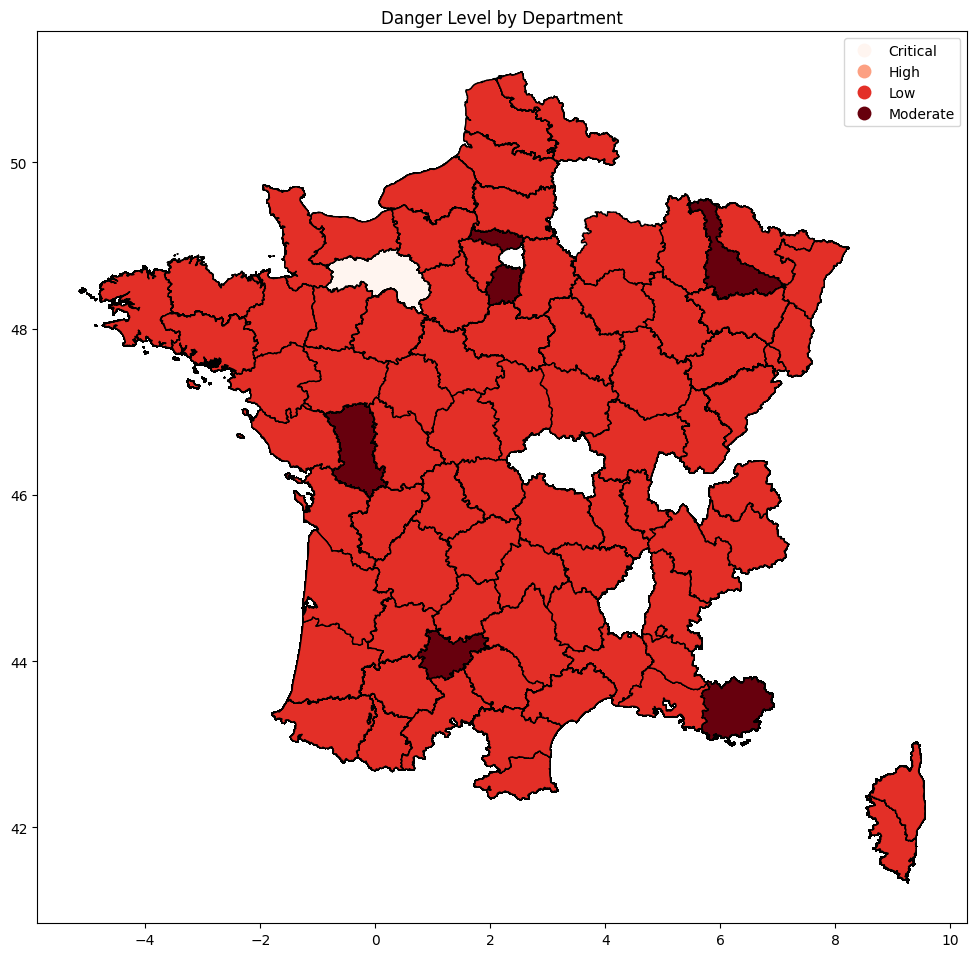

In [176]:
import geopandas as gpd
import matplotlib.pyplot as plt

merge_data = gpd.GeoDataFrame(merge_data, geometry='geometry')


fig, ax = plt.subplots(figsize=(12, 12))

merge_data.plot(
    column='danger level',   # la colonne qui détermine les couleurs
    cmap='Reds',              # palette de couleur rouge/orange
    legend=True,
    edgecolor='black',
    ax=ax
)

plt.title('Danger Level by Department')
plt.show()

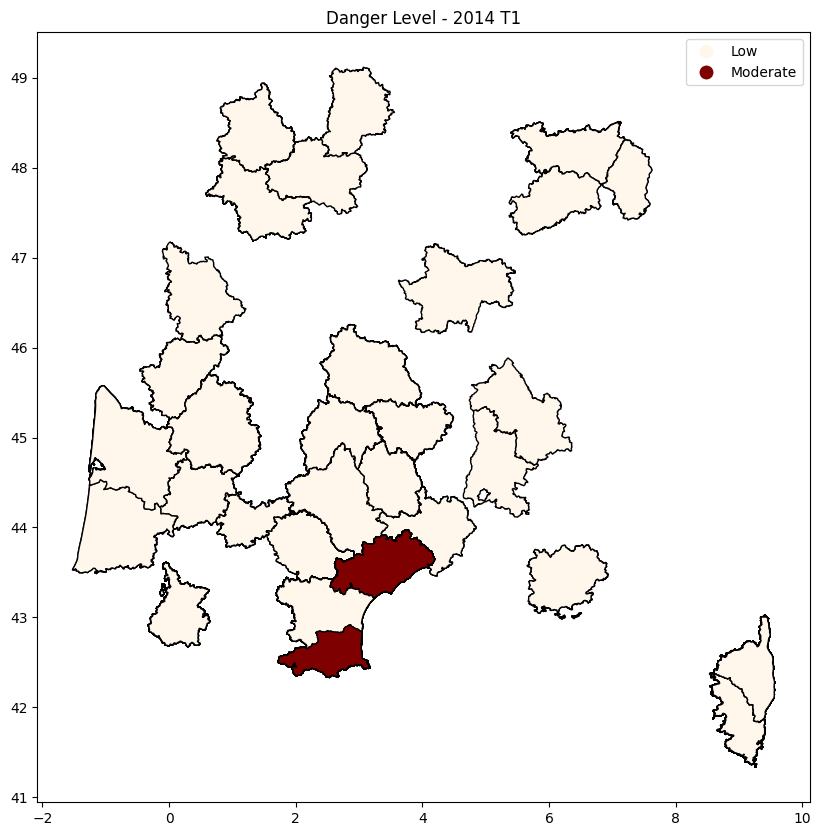

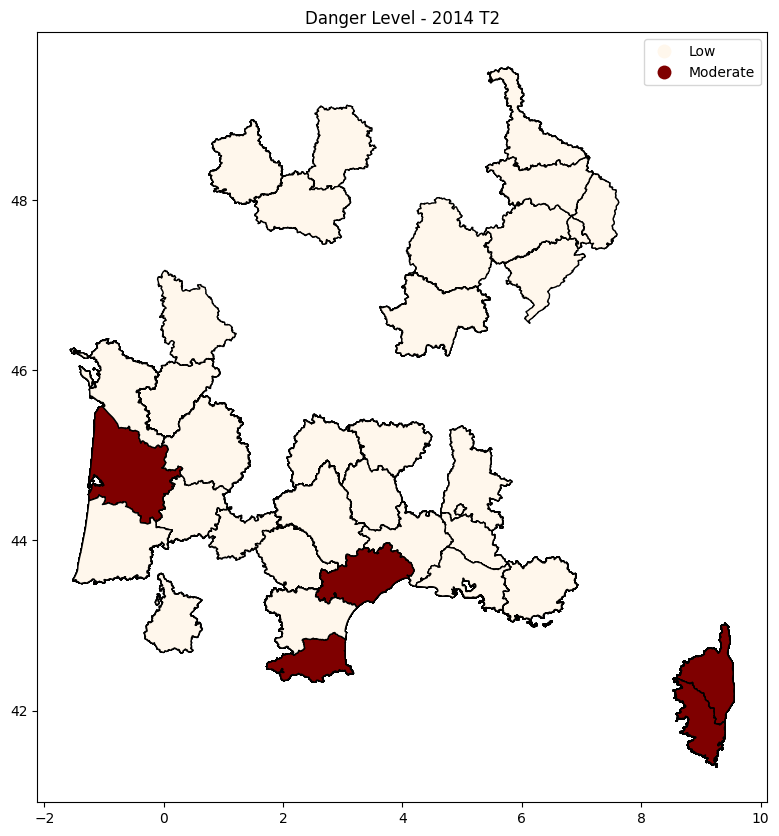

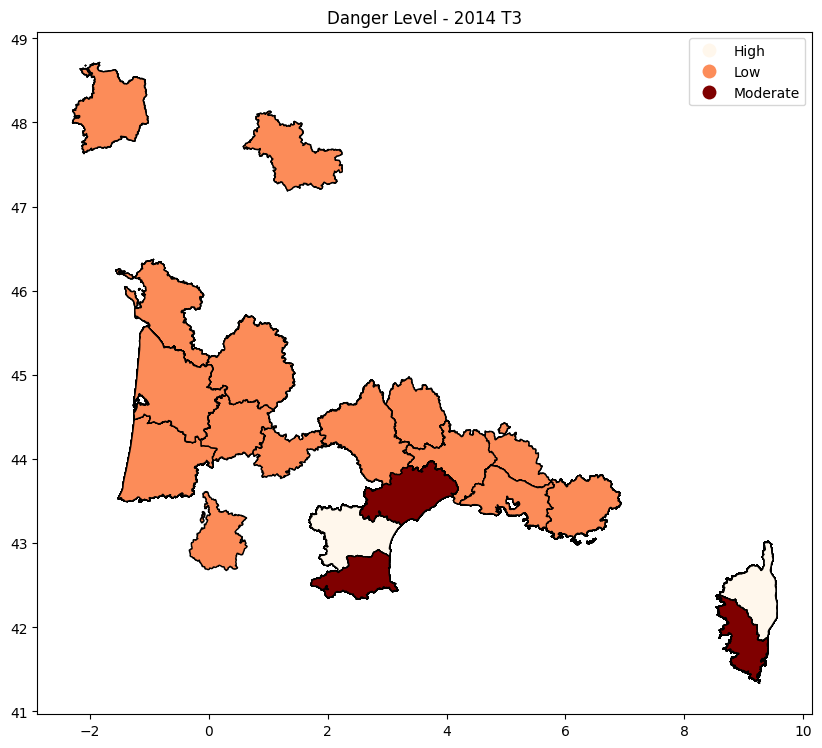

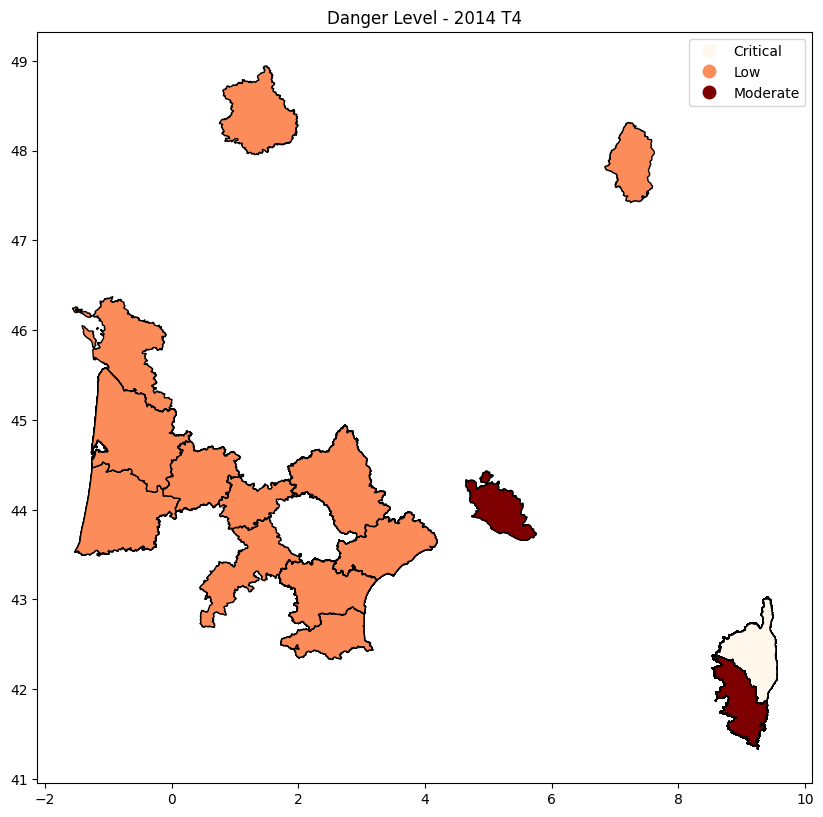

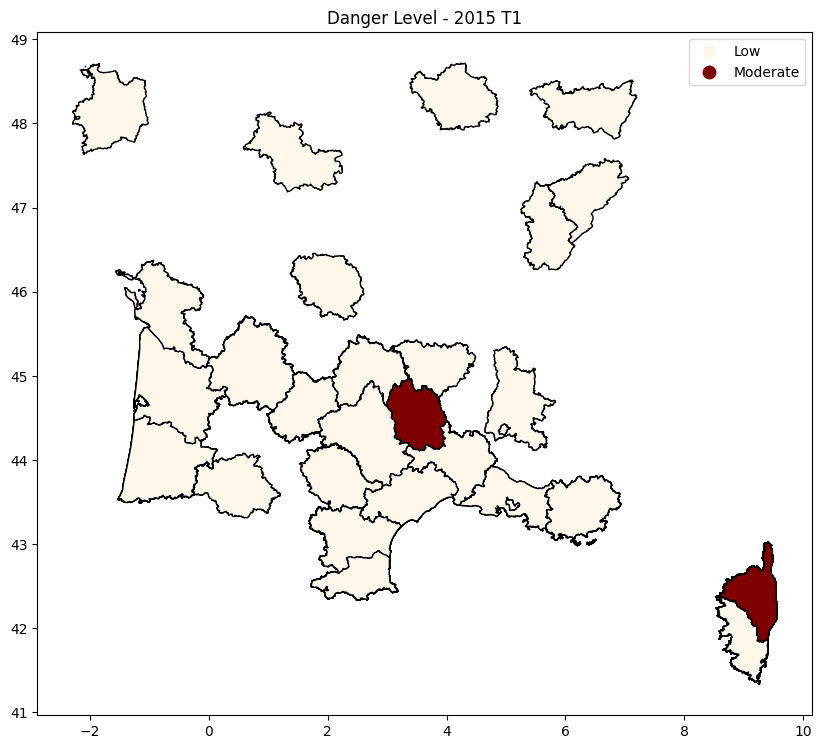

...

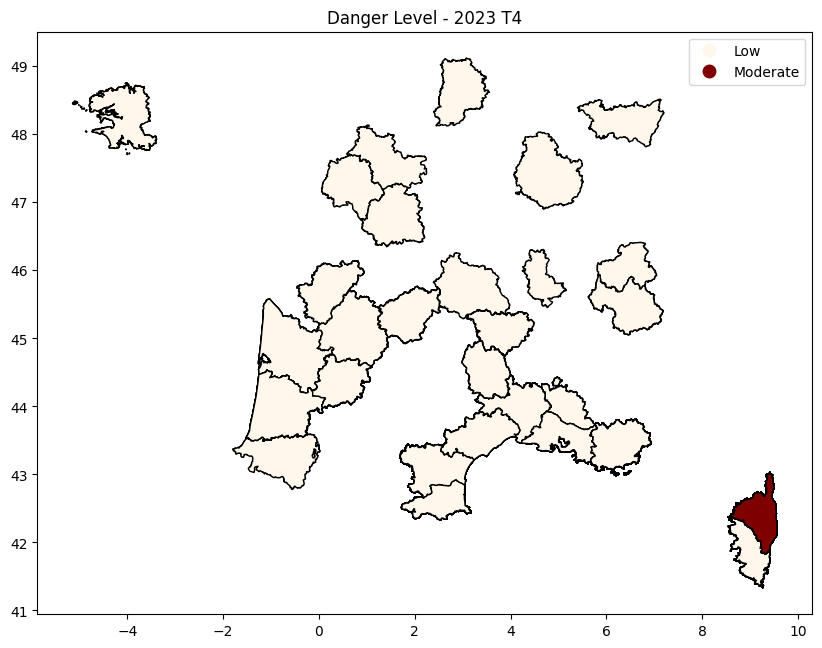

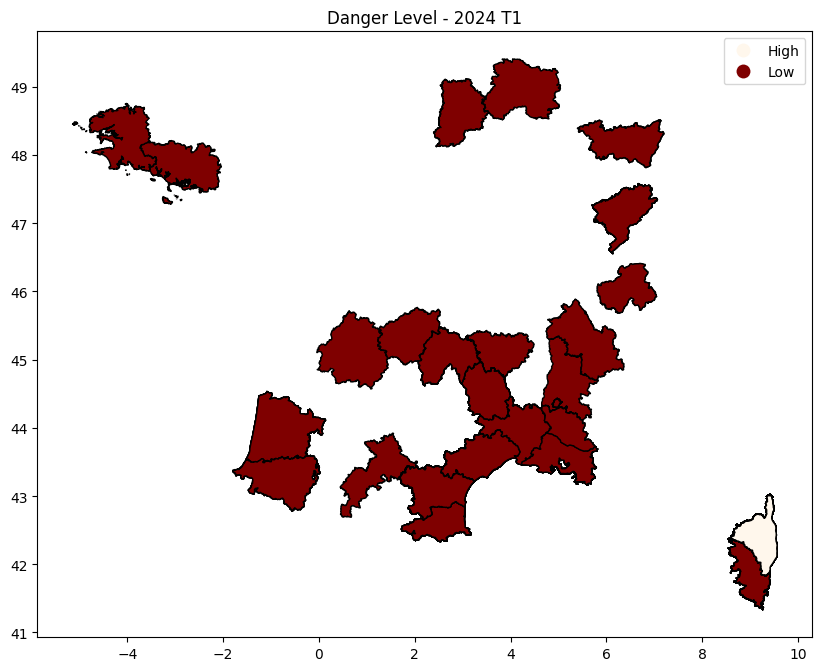

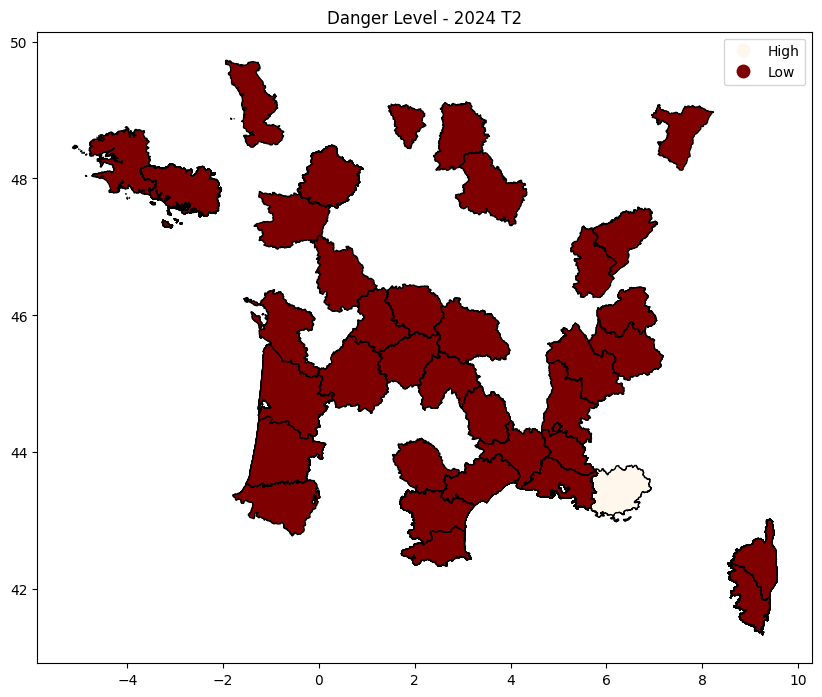

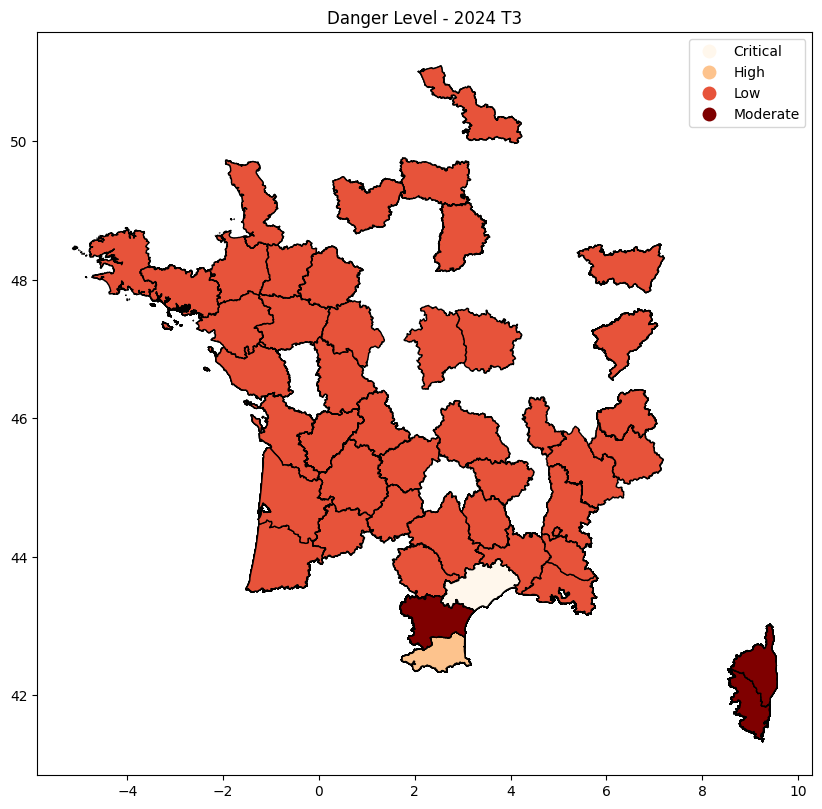

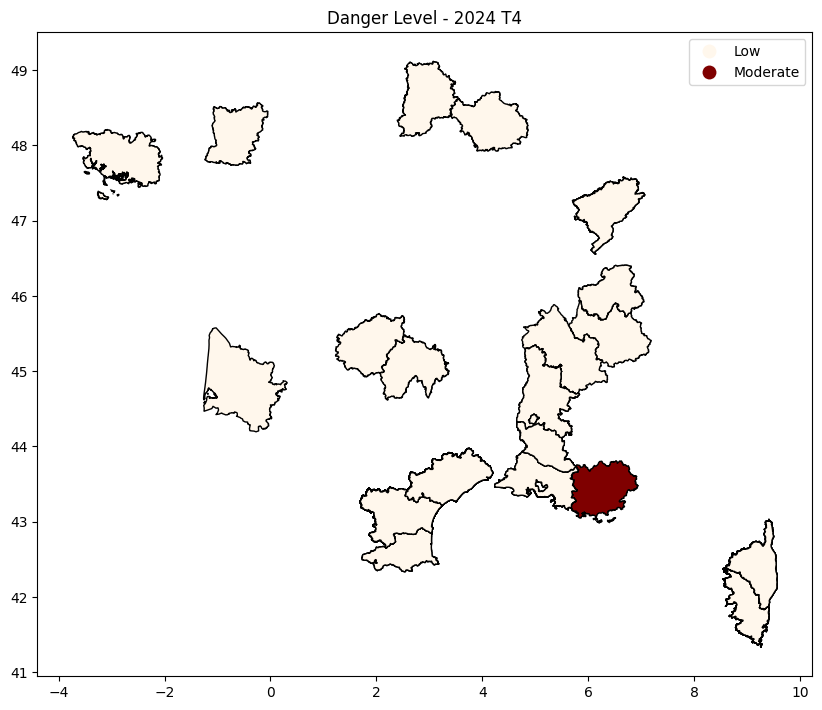

In [178]:
import matplotlib.pyplot as plt

years = merge_data['year'].unique()
quarters = merge_data['quarter'].unique()

for year in sorted(years):
    for quarter in sorted(quarters):
        subset = merge_data[(merge_data['year'] == year) & (merge_data['quarter'] == quarter)]
        
        if not subset.empty:
            fig, ax = plt.subplots(figsize=(10, 10))
            subset.plot(
                column='danger level',
                cmap='OrRd',
                legend=True,
                edgecolor='black',
                ax=ax
            )
            plt.title(f'Danger Level - {year} T{quarter}')
            plt.show()


In [ ]:
px.scatter_map(data_frame=merge_data, 
               lat='latitude',
               lon='longitude',
               #color='Dangerousness',
               height=800,
               width=1200,
               zoom=4)

In [158]:
px.pie(data_frame=merge_data, names='cause')

In [159]:
px.pie(data_frame=merge_data, 
       names='cause', 
       values='area burned (m²)')

In [160]:
px.histogram(data_frame=merge_data, 
             x='year', 
             color='cause',
             barmode='group',
             text_auto='total')

In [161]:
px.histogram(data_frame=merge_data,
             x='month', 
             color='cause',
             barmode='group', 
             text_auto='total')

In [162]:
px.histogram(
    data_frame=merge_data,
    x='quarter',
    color='cause',
    barmode='group',
    text_auto=True
)

In [163]:
px.histogram(data_frame=merge_data,
             x='year_quarter', 
             color='cause',
             barmode='group', 
             text_auto='total')

In [166]:
surface_by_month = merge_data.groupby('month')['area burned (m²)'].sum().reset_index()

px.line(
    data_frame=surface_by_month,
    x='month',
    y='area burned (m²)',
    markers=True,
    title='Total area burned by month'
)


In [167]:
px.histogram(data_frame=merge_data, x='area burned (m²)', nbins=100)

In [168]:
surface_by_quarter = merge_data.groupby('year_quarter')['area burned (m²)'].sum().reset_index()

px.line(
    data_frame=surface_by_quarter,
    x='year_quarter',
    y='area burned (m²)',
    markers=True
)

In [104]:
merge_data.head()

,Année,Numéro,Département,Code INSEE,Date de première alerte,Surface parcourue (m2),Nature,Year,Month,Quarter,Year_Quarter,Dangerousness,latitude,longitude
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),2014,1,1,2014T1,0,42.837199,2.915936
1,2014,2546,2A,2A139,2014-01-09 16:14:00,10,Unknown,2014,1,1,2014T1,1,41.665483,9.319068
2,2014,6,65,65173,2014-01-10 20:04:00,10000,Unknown,2014,1,1,2014T1,1,42.871592,0.010559
3,2014,8243,2B,2B058,2014-01-11 14:00:00,100,Unknown,2014,1,1,2014T1,1,42.843054,9.345566
4,2014,7,65,65233,2014-01-12 16:41:00,200,Unknown,2014,1,1,2014T1,1,43.074628,-0.016598


In [105]:
merge_data.describe()

,Année,Numéro,Date de première alerte,Surface parcourue (m2),Year,Month,Quarter,latitude,longitude
count,34144.000000,34144.000000,34144,3.414400e+04,34144.000000,34144.000000,34144.000000,34144.000000,34144.000000
mean,2019.091905,8852.527940,2019-08-06 06:19:59.782802176,6.179192e+04,2019.091905,6.557082,2.552044,44.165785,3.989085
min,2014.000000,1.000000,2014-01-02 14:56:00,1.000000e+00,2014.000000,1.000000,1.000000,41.435499,-4.720988
25%,2016.000000,3407.000000,2016-09-14 14:10:30,1.000000e+02,2016.000000,5.000000,2.000000,43.104016,1.904154
50%,2019.000000,7726.000000,2019-09-04 14:31:30,8.000000e+02,2019.000000,7.000000,3.000000,43.539342,3.794233
75%,2022.000000,12717.250000,2022-06-17 14:42:45,7.600000e+03,2022.000000,8.000000,3.000000,44.912193,5.765601
max,2024.000000,29809.000000,2024-12-29 12:51:00,1.255200e+08,2024.000000,12.000000,4.000000,50.723542,9.528812
std,3.001408,6467.768355,NaN,1.210286e+06,3.001408,2.400519,0.832649,1.817563,3.214678


# DBSCAN

In [ ]:
geo_features = merge_data[['area burned (m²)']]
scaler = StandardScaler()

geo_scaled = scaler.fit_transform(geo_features)

db = DBSCAN(eps=0.4, min_samples=5)
db.fit(geo_scaled)

merge_data['cluster_spatio_temp'] = db.labels_.astype(str)

merge_data.head()

,Année,Numéro,Département,Code INSEE,Date de première alerte,Surface parcourue (m2),Nature,Year,Month,Quarter,Year_Quarter,Dangerousness,latitude,longitude,cluster_spatio_temp
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),2014,1,1,2014T1,0,42.837199,2.915936,0
1,2014,2546,2A,2A139,2014-01-09 16:14:00,10,Unknown,2014,1,1,2014T1,1,41.665483,9.319068,0
2,2014,6,65,65173,2014-01-10 20:04:00,10000,Unknown,2014,1,1,2014T1,1,42.871592,0.010559,0
3,2014,8243,2B,2B058,2014-01-11 14:00:00,100,Unknown,2014,1,1,2014T1,1,42.843054,9.345566,0
4,2014,7,65,65233,2014-01-12 16:41:00,200,Unknown,2014,1,1,2014T1,1,43.074628,-0.016598,0


In [52]:
np.unique(db.labels_)

array([-1,  0,  1,  2,  3,  4])

In [ ]:
sum(db.labels_ == -1)

np.int64(95)

In [ ]:
merge_data['cluster_spatio_temp'].nunique()

6

In [ ]:
px.scatter_map(
        data_frame=merge_data[merge_data['cluster_spatio_temp'] == '2'],
        lat="latitude",
        lon="longitude",
        color="cluster_spatio_temp",
        animation_frame='year_quarter',
        width=1200,
        height=800,
        color_continuous_scale='Turbo',
        zoom=4
)

In [58]:
# work by depart sum surface km 
# db groupby departement  sum surface
# do the reverse to merge with the original dataset
# try only with nature (nan = unknow) and surface
# option same with lat and long 

In [59]:
merge_data.head()

,Année,Numéro,Département,Code INSEE,Date de première alerte,Surface parcourue (m2),Nature,Year,Month,Quarter,Year_Quarter,Dangerousness,latitude,longitude,cluster_geo,cluster_spatio_temp
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),2014,1,1,2014T1,0,42.837199,2.915936,0,0
1,2014,2546,2A,2A139,2014-01-09 16:14:00,10,Unknown,2014,1,1,2014T1,1,41.665483,9.319068,1,1
2,2014,6,65,65173,2014-01-10 20:04:00,10000,Unknown,2014,1,1,2014T1,1,42.871592,0.010559,0,0
3,2014,8243,2B,2B058,2014-01-11 14:00:00,100,Unknown,2014,1,1,2014T1,1,42.843054,9.345566,1,1
4,2014,7,65,65233,2014-01-12 16:41:00,200,Unknown,2014,1,1,2014T1,1,43.074628,-0.016598,0,0


In [ ]:
geo_features_num = ['area burned (m²)']
geo_features_cat = ['cause']

encoder = OneHotEncoder(drop='first')

categorical_pipeline = Pipeline(
    steps=[
        ('cat_encoder', encoder)
    ]
)

numerical_pipeline = Pipeline(
    steps=[
        ('num_scaler', scaler)
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ('cat_col', categorical_pipeline, geo_features_cat),
        ('num_col', numerical_pipeline, geo_features_num)
    ]
)

x = preprocessor.fit_transform(merge_data)
db = DBSCAN(eps=0.4, min_samples=5)
db.fit(x)

,eps,0.4
,min_samples,5
,metric,'euclidean'
,metric_params,None
,algorithm,'auto'
,leaf_size,30
,p,None
,n_jobs,None


In [61]:
np.unique(db.labels_)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

In [62]:
sum(db.labels_ == -1)

np.int64(60)

In [ ]:
merge_data['cluster_cause_area'] = db.labels_.astype(str)

In [83]:
merge_data.head()

,Année,Numéro,Département,Code INSEE,Date de première alerte,Surface parcourue (m2),Nature,Year,Month,Quarter,Year_Quarter,Dangerousness,latitude,longitude,cluster_geo,cluster_spatio_temp,cluster_nat_surface,cluster_nat_surface_dep
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),2014,1,1,2014T1,0,42.837199,2.915936,0,0,0,0
1,2014,2546,2A,2A139,2014-01-09 16:14:00,10,Unknown,2014,1,1,2014T1,1,41.665483,9.319068,1,1,1,0
2,2014,6,65,65173,2014-01-10 20:04:00,10000,Unknown,2014,1,1,2014T1,1,42.871592,0.010559,0,0,1,0
3,2014,8243,2B,2B058,2014-01-11 14:00:00,100,Unknown,2014,1,1,2014T1,1,42.843054,9.345566,1,1,1,0
4,2014,7,65,65233,2014-01-12 16:41:00,200,Unknown,2014,1,1,2014T1,1,43.074628,-0.016598,0,0,1,0


In [ ]:
px.scatter_map(
        data_frame=merge_data,
        lat="latitude",
        lon="longitude",
        color="cluster_cause_area",
        animation_frame='year_quarter',
        width=1200,
        height=800,
        color_continuous_scale='Turbo',
        zoom=4,
        hover_name='cause'
)

In [ ]:
geo_features_cat = ['department', 'cause']
geo_features_num = ['area burned (m²)']

categorical_pipeline = Pipeline(
    steps=[
        ('cat_encoder', encoder)
    ]
)

numerical_pipeline = Pipeline(
    steps=[
        ('num_scaler', scaler)
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_pipeline, geo_features_cat),
        ('num', numerical_pipeline, geo_features_num)
    ]
)

x = preprocessor.fit_transform(merge_data)

db = DBSCAN(eps=1, min_samples=5)
db.fit(x)

,eps,1
,min_samples,5
,metric,'euclidean'
,metric_params,None
,algorithm,'auto'
,leaf_size,30
,p,None
,n_jobs,None


In [66]:
np.unique(db.labels_)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,
       33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44])

In [67]:
sum(db.labels_ == -1)

np.int64(304)

In [ ]:
merge_data['cluster_cause_area_dep'] = db.labels_.astype(str)

In [ ]:
px.scatter_map(
        data_frame=merge_data,
        lat="latitude",
        lon="longitude",
        color="cluster_cause_area_dep",
        animation_frame='year_quarter',
        width=1200,
        height=800,
        color_continuous_scale='Turbo',
        zoom=4,
        hover_name='cause'
)

In [70]:
# work by depart sum surface km 
# db groupby departement  sum surface
# do the reverse to merge with the original dataset

In [71]:
merge_data.head()

,Année,Numéro,Département,Code INSEE,Date de première alerte,Surface parcourue (m2),Nature,Year,Month,Quarter,Year_Quarter,Dangerousness,latitude,longitude,cluster_geo,cluster_spatio_temp,cluster_nat_surface,cluster_nat_surface_dep
0,2014,6330,66,66190,2014-01-02 14:56:00,10000,Involontaire (particulier),2014,1,1,2014T1,0,42.837199,2.915936,0,0,0,0
1,2014,2546,2A,2A139,2014-01-09 16:14:00,10,Unknown,2014,1,1,2014T1,1,41.665483,9.319068,1,1,1,0
2,2014,6,65,65173,2014-01-10 20:04:00,10000,Unknown,2014,1,1,2014T1,1,42.871592,0.010559,0,0,1,0
3,2014,8243,2B,2B058,2014-01-11 14:00:00,100,Unknown,2014,1,1,2014T1,1,42.843054,9.345566,1,1,1,0
4,2014,7,65,65233,2014-01-12 16:41:00,200,Unknown,2014,1,1,2014T1,1,43.074628,-0.016598,0,0,1,0


In [170]:
df = merge_data.groupby(['department', 'year', 'month', 'quarter', 'year_quarter', 'latitude', 'longitude'])['area burned (m²)'].sum().reset_index()
df.sort_values('year', ascending=True)

,department,year,month,quarter,year_quarter,latitude,longitude,area burned (m²)
51,11,2014,5,2,2014T2,43.165240,3.020239,13456
71,11,2014,6,2,2014T2,43.257801,3.005475,10700
70,11,2014,6,2,2014T2,43.247738,2.649871,2110
69,11,2014,6,2,2014T2,43.236124,3.107172,2
81,11,2014,7,3,2014T3,43.095723,2.604360,100
...,...,...,...,...,...,...,...,...
17766,66,2024,9,3,2024T3,42.796474,2.822350,10000
17767,66,2024,9,3,2024T3,42.819503,2.377520,80000
17768,66,2024,11,4,2024T4,42.513691,1.927048,50
17769,66,2024,11,4,2024T4,42.522119,2.065188,16


In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21076 entries, 0 to 21075
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Département             21076 non-null  object 
 1   Year                    21076 non-null  int32  
 2   Month                   21076 non-null  int32  
 3   Quarter                 21076 non-null  int32  
 4   Year_Quarter            21076 non-null  object 
 5   latitude                21076 non-null  float64
 6   longitude               21076 non-null  float64
 7   Surface parcourue (m2)  21076 non-null  int64  
dtypes: float64(2), int32(3), int64(1), object(2)
memory usage: 1.0+ MB


In [ ]:
geo_features_num = ['area burned (m²)']
geo_features_cat = ['department']

categorical_pipeline = Pipeline(
    steps=[
        ('cat_encoder', encoder)
    ]
)

numerical_pipeline = Pipeline(
    steps=[
        ('num_scaler', scaler)
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ('cat_col', categorical_pipeline, geo_features_cat),
        ('num_col', numerical_pipeline, geo_features_num)
    ]
)

x = preprocessor.fit_transform(df)
db = DBSCAN(eps=0.4, min_samples=5)
db.fit(x)

,eps,0.4
,min_samples,5
,metric,'euclidean'
,metric_params,None
,algorithm,'auto'
,leaf_size,30
,p,None
,n_jobs,None


In [75]:
np.unique(db.labels_)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32,
       33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,
       50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66,
       67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79])

In [76]:
df['cluster'] = db.labels_.astype(str)

In [ ]:
px.scatter_map(
        data_frame=df,
        lat="latitude",
        lon="longitude",
        color="cluster",
        animation_frame='year_quarter',
        width=1200,
        height=800,
        color_continuous_scale='Turbo',
        zoom=4,
        #hover_name='Nature'
)